<a href="https://colab.research.google.com/github/infinitron/gcolabs/blob/main/Fitting_PSF_in_1D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import pymc3 as pm
import pandas as pd
import numpy as np

from astropy.io import fits
import matplotlib.pyplot as plt
import theano.tensor as tt
from theano import function
from theano.tensor import _shared
import seaborn as sns
import matplotlib.animation as animation


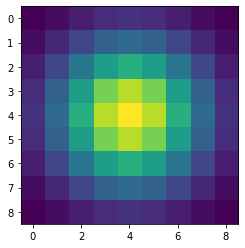

In [3]:
with fits.open("sample_data/normg_f4_9x9.fits") as hdul:
    data1=hdul[0].data

plt.imshow(data1)

81

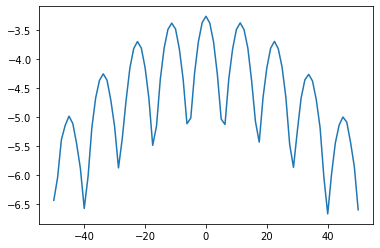

In [14]:
with fits.open("sample_data/normg_f4_9x9.fits") as hdul:
    data1=hdul[0].data

minv=data1.min()
data1=(data1+np.random.random(data1.shape)*0.0005)/data1.sum()
#plt.plot(np.linspace(0,1,data1.flatten().shape[0]),np.log(data1.flatten()));
#plt.plot(np.linspace(0,1,data1.flatten().shape[0]),data1.flatten());


#normalize the data
#data1=data1-data1.mean()
#data1=data1/data1.std()

xvals=np.linspace(0,100,data1.flatten().shape[0])[:,None]
xvals_sym=(xvals-50).tolist()[::]

yvals=np.log(data1.flatten())[:,None].tolist()[::]
fig,ax=plt.subplots(1,1)
ax.plot(xvals_sym,yvals)
#ax.set_xlim([-5,5])
len(yvals)

In [15]:
def warp_func(x):
  return np.abs(x)

/usr/local/lib/python3.7/dist-packages/pymc3/gp/cov.py:97: UserWarning: Only 1 column(s) out of Subtensor{int64}.0 are being used to compute the covariance function. If this is not intended, increase 'input_dim' parameter to the number of columns to use. Ignore otherwise.
  UserWarning,


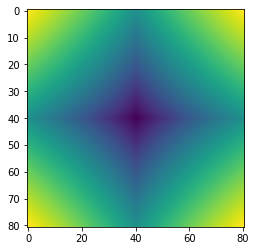

In [35]:
#@title Default title text
with pm.Model() as model2:
    l = 9
    l2=1
    T =1
    c=-100
    d=2
    f1=pm.gp.cov.Periodic(1,9,l)#* pm.gp.cov.ExpQuad(1,l)
    f2=pm.gp.cov.Matern52(1,l2)
    f3=pm.gp.cov.Linear(1,c)
    f_cov=f1*f2+f3*f3
    f_warp=pm.gp.cov.WarpedInput(1,warp_func=warp_func,cov_func=f_cov)

K = function([], f_warp(np.asarray(xvals_sym)))()#* pm.gp.cov.ExpQuad(1,l))))()
plt.imshow(np.log(K))
#fig,ax=plt.subplots(1,2,figsize=(10,7))
#plt.plot(np.asarray(xvals_sym),np.random.multivariate_normal(np.zeros(np.asarray(xvals_sym).shape[0]),K));
#ax.set_xlim([-5,5])

In [36]:
with pm.Model() as model1:
    # priors on the covariance function hyperparameters
    #l=pm.Gamma('l_s_p',alpha=5,beta=0.5)
    T=pm.Gamma('T',alpha=20,beta=20)
    l=pm.Gamma('l1',alpha=20,beta=20 )#pm.HalfNormal('l1',sd=20)
    l2=pm.Gamma('l2',alpha=20,beta=20)#pm.HalfNormal('l2',sd=30)
    c=pm.Normal('c',mu=0,sd=50)
    variance=pm.HalfNormal('var',10)
    
    f1=variance *pm.gp.cov.Periodic(1,9,l)#* pm.gp.cov.ExpQuad(1,l)
    f2=pm.gp.cov.Matern52(1,l2)
    f3=pm.gp.cov.Linear(1,c)
    f_cov=f1*f2+f3*f3
    f_warp=pm.gp.cov.WarpedInput(1,warp_func=warp_func,cov_func=f_cov)
    noise=pm.HalfNormal('noise',sd=0.01)

    gp1 = pm.gp.Marginal(cov_func=f_warp)
    
    y_obs = gp1.marginal_likelihood('y_obs', noise=noise, X=np.asarray(xvals_sym),y=np.asarray(yvals).squeeze())

/usr/local/lib/python3.7/dist-packages/pymc3/gp/cov.py:97: UserWarning: Only 1 column(s) out of Subtensor{int64}.0 are being used to compute the covariance function. If this is not intended, increase 'input_dim' parameter to the number of columns to use. Ignore otherwise.
  UserWarning,


In [37]:
with model1:
    trace=pm.sample(2000,return_inferencedata=True,tune=1000,chains=4,cores=4)

WARNING (theano.tensor.blas): We did not find a dynamic library in the library_dir of the library we use for blas. If you use ATLAS, make sure to compile it with dynamics library.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
WARNING (theano.tensor.blas): We did not find a dynamic library in the library_dir of the library we use for blas. If you use ATLAS, make sure to compile it with dynamics library.
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [noise, var, c, l2, l1, T]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 301 seconds.


In [38]:
xnew=np.asarray(xvals)

In [39]:
pm.summary(trace)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
c,-128.149,22.204,-169.230,-86.760,0.272,0.193,6672.0,5663.0,1.0
T,0.995,0.218,0.596,1.393,0.002,0.001,10234.0,6696.0,1.0
l1,1.234,0.216,0.841,1.637,0.002,0.002,8410.0,6300.0,1.0
l2,2.016,0.266,1.517,2.511,0.003,0.002,6413.0,5906.0,1.0
var,0.343,0.093,0.197,0.520,0.001,0.001,6344.0,5927.0,1.0
noise,0.035,0.003,0.029,0.041,0.000,0.000,9176.0,6408.0,1.0


In [41]:
xnew=np.linspace(-40,40,70)[:,None]
print(xnew.shape)
with model1:
    y_pred = gp1.conditional("y_pred1",Xnew=xvals-50,pred_noise=True)


(70, 1)


/usr/local/lib/python3.7/dist-packages/pymc3/gp/cov.py:97: UserWarning: Only 1 column(s) out of Subtensor{int64}.0 are being used to compute the covariance function. If this is not intended, increase 'input_dim' parameter to the number of columns to use. Ignore otherwise.
  UserWarning,
/usr/local/lib/python3.7/dist-packages/pymc3/gp/cov.py:97: UserWarning: Only 1 column(s) out of Subtensor{int64}.0 are being used to compute the covariance function. If this is not intended, increase 'input_dim' parameter to the number of columns to use. Ignore otherwise.
  UserWarning,


In [42]:
with model1:
  pred_samples = pm.sample_posterior_predictive(trace,var_names=['y_pred1'] ,samples=12000)

In [43]:
pred_samples['y_pred1'].shape

(12000, 81)

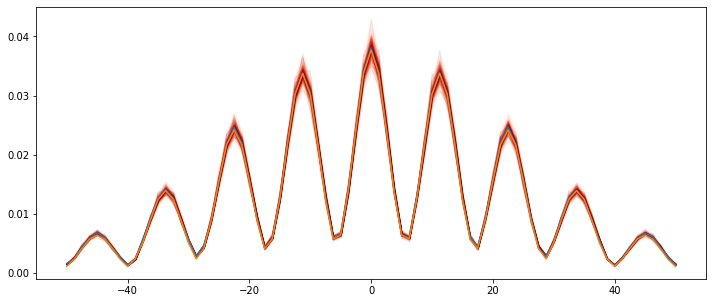

In [44]:
# plot the results
fig = plt.figure(figsize=(12, 5))
ax = fig.gca()

# plot the samples from the gp posterior with samples and shading
from pymc3.gp.util import plot_gp_dist

plot_gp_dist(ax, np.exp(pred_samples["y_pred1"][2000:]), xvals-50)
plt.plot(xvals-50,np.exp(yvals))

with fits.open("sample_data/normg_f4_9x9.fits") as hdul:
    d2=hdul[0].data
plt.plot(xvals-50,(d2/d2.sum()).flatten())
#ax.set_xlim([-40,40]

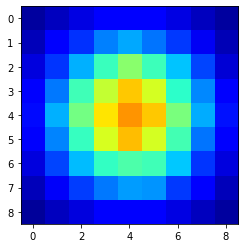

In [ ]:
fig = plt.figure() # make figure

# make axesimage object
# the vmin and vmax here are very important to get the color map correct
im = plt.imshow(np.exp(pred_samples["y_pred1"][0]).reshape((9,9),order='F'), cmap=plt.get_cmap('jet'), vmin=0, vmax=0.05)

# function to update figure
def updatefig(j):
    # set the data in the axesimage object
    im.set_array(np.exp(pred_samples["y_pred1"][j]).reshape((9,9),order='F'))
    # return the artists set
    return [im]
# kick off the animation
anim = animation.FuncAnimation(fig, updatefig, frames=range(12000), 
                              interval=50, blit=True)

from IPython.display import HTML
HTML(anim.to_html5_video())

# Larger Image

Text(0.5, 1.0, 'Percent difference')

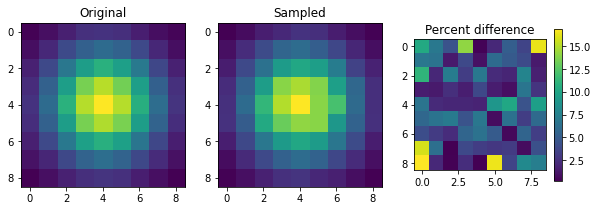

In [ ]:
a=np.exp(pred_samples["y_pred1"][4000]).reshape((9,9),order='F')
a=a/a.sum()

fig,ax=plt.subplots(1,3,figsize=(10,7))
ax[1].imshow(a)
ax[0].imshow(data1)
ax[1].set_title('Sampled')
ax[0].set_title('Original');
im=ax[2].imshow(np.abs(a-data1)*100/data1)
fig.colorbar(im,ax=ax[2],shrink=0.4)
ax[2].set_title('Percent difference')

In [ ]:
with fits.open("sample_data/psf_33x33.fits") as hdul:
    data1=hdul[0].data

with fits.open("sample_data/psf_asym.fits") as hdul:
    data2=hdul[0].data

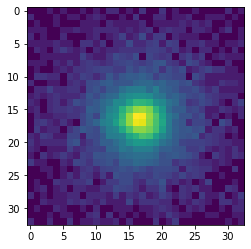

In [ ]:
plt.imshow(np.log(data1+1))

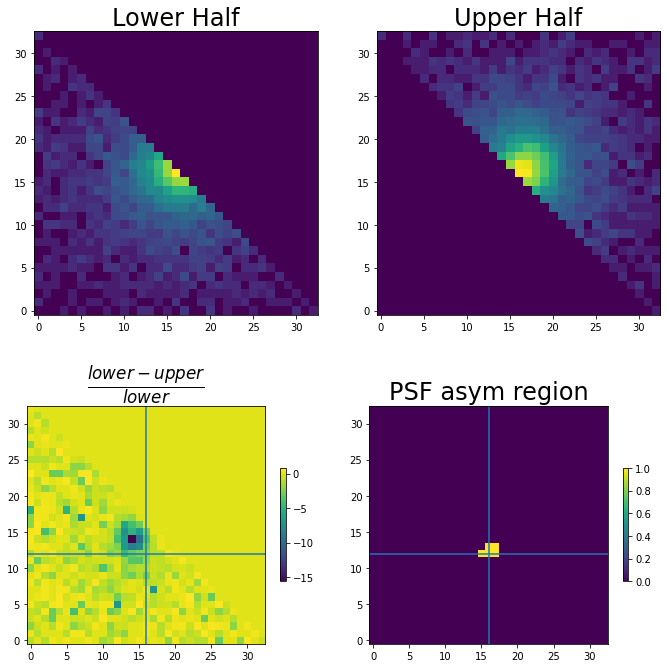

In [ ]:
fig,ax=plt.subplots(2,2,figsize=(10,10))
low=np.flipud(np.tril(np.flipud(data1)))
ax[0,0].imshow(np.log(low+1),origin='lower')
ax[0,0].set_title('Lower Half',fontsize=24)
up=np.flipud(np.triu(np.flipud(data1)))
ax[0,1].imshow(np.log(up+1),origin='lower')
ax[0,1].set_title('Upper Half',fontsize=24)
flip=np.fliplr(np.triu(np.flipud(data1)))
diff=(low-flip)/(low+1)
im=ax[1,0].imshow(diff,origin='lower')
ax[1,0].set_title(r'$\frac{lower-upper}{lower}$',fontsize=24)
fig.colorbar(im,ax=ax[1,0],shrink=0.4)
ax[1,0].axvline(16,0,1)
ax[1,0].axhline(12,0,1)


data2[data2!=data2]=0
diff[diff!=diff]=0
mult=np.multiply(data2,diff)
mult[mult!=mult]=0
im2=ax[1,1].imshow(data2,origin='lower')
ax[1,1].axvline(16,0,1)
ax[1,1].axhline(12,0,1)

ax[1,1].set_title("PSF asym region",fontsize=24)
fig.colorbar(im2,ax=ax[1,1],shrink=0.4)

fig.tight_layout(pad=3.0)

# 33x33 PSF modeling

218

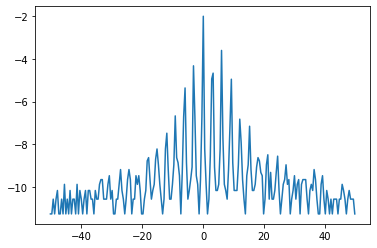

In [ ]:
with fits.open("sample_data/psf_33x33.fits") as hdul:
    data2=hdul[0].data

data2=(data2+1)/data2.sum()
xvals2=np.linspace(0,100,data2.flatten().shape[0])[:,None]
xvals_sym2=(xvals2-50).tolist()[::5]

yvals2=np.log(data2.flatten())[:,None].tolist()[::5]
fig,ax=plt.subplots(1,1)
ax.plot(xvals_sym2,yvals2)
#ax.set_xlim([-5,5])
len(yvals2)

## Setting up the GP

In [ ]:
time_period=33
with pm.Model() as model2:
    # priors on the covariance function hyperparameters
    ##l=pm.Gamma('l_s_p',alpha=5,beta=0.5)
    T=pm.Gamma('T',alpha=20,beta=20)
    l=pm.Gamma('l1',alpha=20,beta=20 )#pm.HalfNormal('l1',sd=20)
    l2=pm.Gamma('l2',alpha=20,beta=20)#pm.HalfNormal('l2',sd=30)
    c=pm.Normal('c',mu=0,sd=50)
    variance=pm.HalfNormal('var',10)
    
    f1=variance *pm.gp.cov.Periodic(1,time_period,l)#* pm.gp.cov.ExpQuad(1,l)
    f2=pm.gp.cov.Matern52(1,l2)
    f3=pm.gp.cov.Linear(1,c)
    f_cov=f1*f2+f3*f3
    f_warp=pm.gp.cov.WarpedInput(1,warp_func=warp_func,cov_func=f_cov)
    noise=pm.HalfNormal('noise',sd=1)

    gp1 = pm.gp.Marginal(cov_func=f_warp)
    
    y_obs = gp1.marginal_likelihood('y_obs', noise=noise, X=np.asarray(xvals_sym2),y=np.asarray(yvals2).squeeze())

/usr/local/lib/python3.7/dist-packages/pymc3/gp/cov.py:97: UserWarning: Only 1 column(s) out of Subtensor{int64}.0 are being used to compute the covariance function. If this is not intended, increase 'input_dim' parameter to the number of columns to use. Ignore otherwise.
  UserWarning,


In [ ]:
with model2:
    trace=pm.sample(200,return_inferencedata=True,tune=100,chains=4,cores=4)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [noise, var, c, l2, l1]


In [ ]:
pm.summary(trace)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
c,-143.215,27.238,-191.704,-90.352,1.061,0.751,639.0,672.0,1.01
T,1.018,0.231,0.630,1.466,0.010,0.008,529.0,516.0,1.00
l1,1.000,0.224,0.587,1.397,0.009,0.006,590.0,693.0,1.00
l2,0.829,0.115,0.621,1.041,0.005,0.003,634.0,507.0,1.00
var,3.243,1.024,1.551,5.094,0.047,0.034,550.0,484.0,1.00
noise,0.521,0.038,0.450,0.586,0.001,0.001,849.0,599.0,1.00


In [ ]:
with model2:
    y_pred = gp1.conditional("y_pred1",Xnew=xvals2-50,pred_noise=True)


/usr/local/lib/python3.7/dist-packages/pymc3/gp/cov.py:97: UserWarning: Only 1 column(s) out of Subtensor{int64}.0 are being used to compute the covariance function. If this is not intended, increase 'input_dim' parameter to the number of columns to use. Ignore otherwise.
  UserWarning,


## Sampling the PP

In [ ]:
with model2:
  pred_samples = pm.sample_posterior_predictive(trace,var_names=['y_pred1'] ,samples=1200)

ValueError: ignored

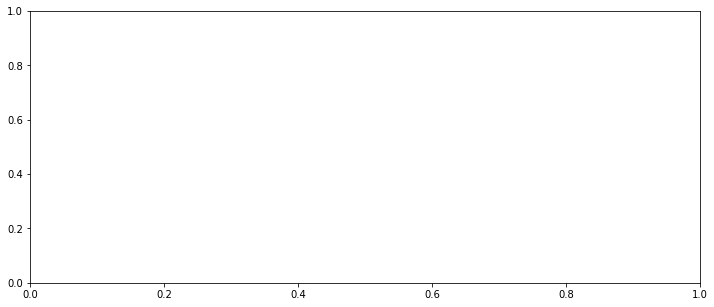

In [ ]:
# plot the results
fig = plt.figure(figsize=(12, 5))
ax = fig.gca()

# plot the samples from the gp posterior with samples and shading
from pymc3.gp.util import plot_gp_dist

plot_gp_dist(ax, np.exp(pred_samples["y_pred1"][:]), np.asarray(xvals_sym2))
plt.plot(np.asarray(xvals_sym2),np.exp(yvals2))

#ax.set_xlim([-40,40]

In [ ]:
pred_samples["y_pred1"].shape

(1200, 1089)